# Init 

In [1]:
import os 

path = os.getcwd()
os.chdir("..")
new_path = os.getcwd()


from vanilla import abc_vanilla, perm_abc_vanilla
from smc import abc_smc, perm_abc_smc
from over_sampling import perm_abc_smc_os
from kernels import KernelTruncatedRW
from models.uniform import Uniform
from models.uniform_known import Uniform_known
os.chdir(path)
from jax import random
import numpy as np
import jax.numpy as jnp
import matplotlib.pyplot as plt
import seaborn as sns
%load_ext autoreload
%autoreload 2


In [5]:
model = Uniform(K = 2)
model_known = Uniform_known(K = 2)
# y_obs = np.array([-1,1])[None, :, None]
y_obs = np.array([0, 1])[None, :, None]
key = random.PRNGKey(0)
y = y_obs[0,:,0]
epsilon_star = model.distance(y_obs, y_obs[:,::-1])[0]/2
print("Epsilon star", epsilon_star)

Epsilon star 0.35355338


# With unknown Beta

array([0.5])

## ABC


In [3]:
key, subkey = random.split(key)
Nsim = 1000000
zs_van, thetas_van, dists_van = abc_vanilla(subkey, model, Nsim, np.inf, y_obs)

## permABC

In [4]:
key, subkey = random.split(key)
zs_perm_van, thetas_perm_van, dists_perm_van = perm_abc_vanilla(subkey, model, Nsim, np.inf, y_obs)

Performing full optimal assignment (no prior indices).


## plot

Epsilon = 4.877860069274902 Epsilon perm = 5.030364990234375


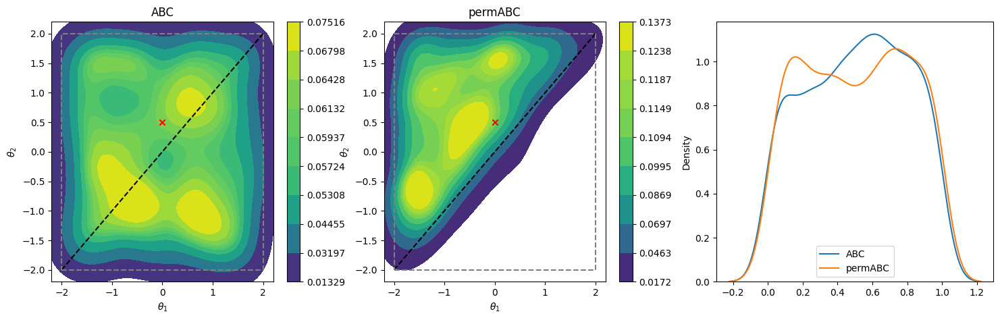

Epsilon = 1.1239870190620422 Epsilon perm = 0.8821120709180832


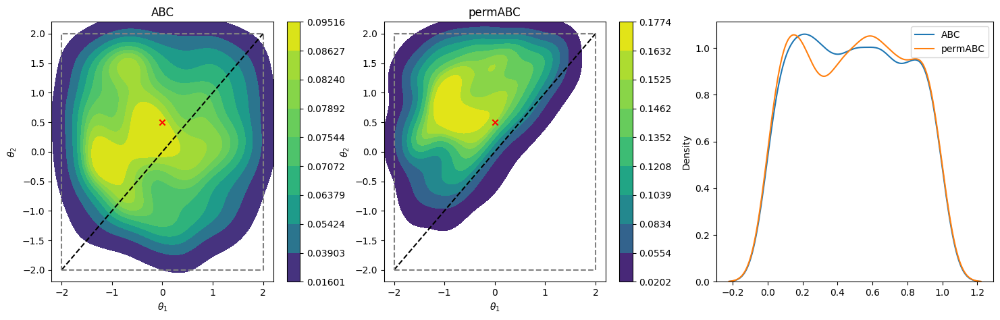

Epsilon = 0.6663489639759064 Epsilon perm = 0.498417004942894


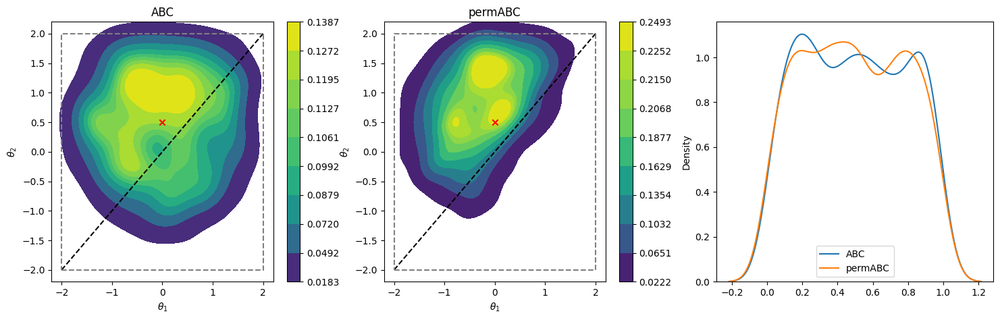

Epsilon = 0.12737439572811127 Epsilon perm = 0.07182187214493753


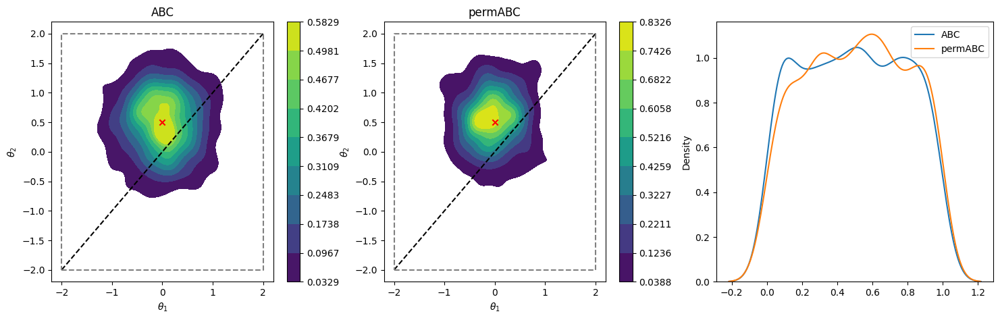

Epsilon = 0.012667105728760363 Epsilon perm = 0.006297745774500072


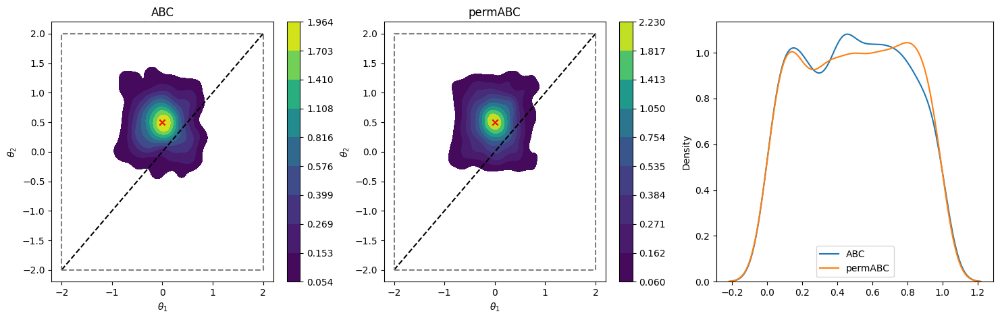

Epsilon = 0.0012898978021694347 Epsilon perm = 0.0006114178820280358


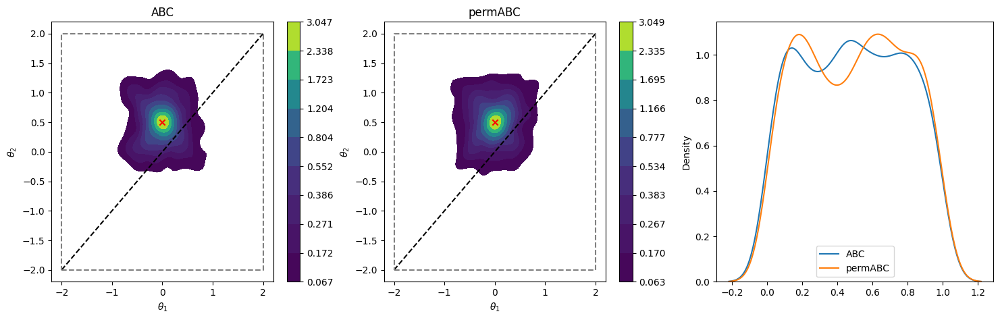

In [ ]:
alphas = [1., .75, .5, .1, .01, .001]
N = 1000
x = np.linspace(-2,2,100)
for alpha in alphas:
    epsilon = np.quantile(dists_van, alpha)
    epsilon_perm = np.quantile(dists_perm_van, alpha)
    print("Epsilon = {} Epsilon perm = {}".format(epsilon, epsilon_perm))
    index = np.random.choice(np.where(dists_van<=epsilon)[0], N, replace = False)
    index_perm = np.random.choice(np.where(dists_perm_van<=epsilon_perm)[0], N, replace = False)
    
    mus = thetas_van.loc[index].squeeze()
    betas = thetas_van.glob[index].squeeze()
    
    mus_perm = thetas_perm_van.loc[index_perm].squeeze()
    betas_perm = thetas_perm_van.glob[index_perm].squeeze()
    
    f, ax = plt.subplots(1,3, figsize = (18,5))
    sns.kdeplot(x=mus[:,0], y=mus[:,1], cmap='viridis', thresh = .05, cbar=True,fill=True, ax = ax[0])
    
    prior = np.array([[-2,-2],[2,-2],[2,2],[-2,2],[-2,-2]])
    # posterior = np.array([[y[0]-s, y[1]-s], [y[0]+s, y[1]-s], [y[0]+s, y[1]+s], [y[0]-s, y[1]+s], [y[0]-s, y[1]-s]])

    ax[0].scatter(y_obs[0,0,0], y_obs[0,1,0], c='red', label='y',marker='x')
    ax[0].plot(x,x, '--', color='black')
    # ax[0].plot(posterior[:, 0], posterior[:, 1], color='red',linestyle='--')
    ax[0].plot(prior[:, 0], prior[:, 1], color='grey',linestyle='--')
    ax[0].set_title('ABC')
    ax[0].set_xlabel('$\\theta_1$')
    ax[0].set_ylabel('$\\theta_2$')
    ax[0].set_xlim(-2.2,2.2)
    ax[0].set_ylim(-2.2,2.2)
    sns.kdeplot(x=mus_perm[:, 0], y=mus_perm[:, 1], cmap='viridis', thresh = .05, cbar=True,fill=True, ax = ax[1])
    ax[1].scatter(y_obs[0,0,0], y_obs[0,1,0], c='red', label='y',marker='x')
    ax[1].plot(x,x, '--', color='black')
    # ax[1].plot(posterior[:, 0], posterior[:, 1], color='red',linestyle='--')
    ax[1].plot(prior[:, 0], prior[:, 1], color='grey',linestyle='--')
    ax[1].set_title('permABC')
    ax[1].set_xlabel('$\\theta_1$')
    ax[1].set_ylabel('$\\theta_2$')
    ax[1].set_xlim(-2.2,2.2)
    ax[1].set_ylim(-2.2,2.2)
    
    sns.kdeplot(betas, ax = ax[2], label = 'ABC')
    sns.kdeplot(betas_perm, ax = ax[2], label= "permABC")
    ax[2].legend()
    plt.show()
    

# With known Beta

## ABC

In [ ]:
key, subkey = random.split(key)
Nsim = 10000000
zs, thetas, dists,_ = abc_vanilla(subkey, model_known, Nsim, np.inf, y_obs)

## permABC

In [ ]:
key, subkey = random.split(key)
zs_perm, thetas_perm, dists_perm, _ = perm_abc_vanilla(subkey, model_known, Nsim, np.inf, y_obs)

Performing full optimal assignment (no prior indices).


In [ ]:
print("DISTANCE VANILLA: min = {}, max = {}, mean = {}".format(np.min(dists), np.max(dists), np.mean(dists)))
print("DISTANCE PERM: min = {}, max = {}, mean = {}".format(np.min(dists_perm), np.max(dists_perm), np.mean(dists_perm)))
print("<= epsilon star : vanille = {} ({:.2%}), perm = {} ({:.2%})".format(np.sum(dists<=epsilon_star), np.mean(dists<=epsilon_star), np.sum(dists_perm<=epsilon_star), np.mean(dists_perm<=epsilon_star)))


DISTANCE VANILLA: min = 0.00036666198866441846, max = 2.2592318058013916, mean = 0.8642190098762512
DISTANCE PERM: min = 0.00027289442368783057, max = 2.2470219135284424, mean = 0.7567166090011597
<= epsilon star : vanille = 244746 (2.45%), perm = 491538 (4.92%)


In [ ]:
import numpy as np

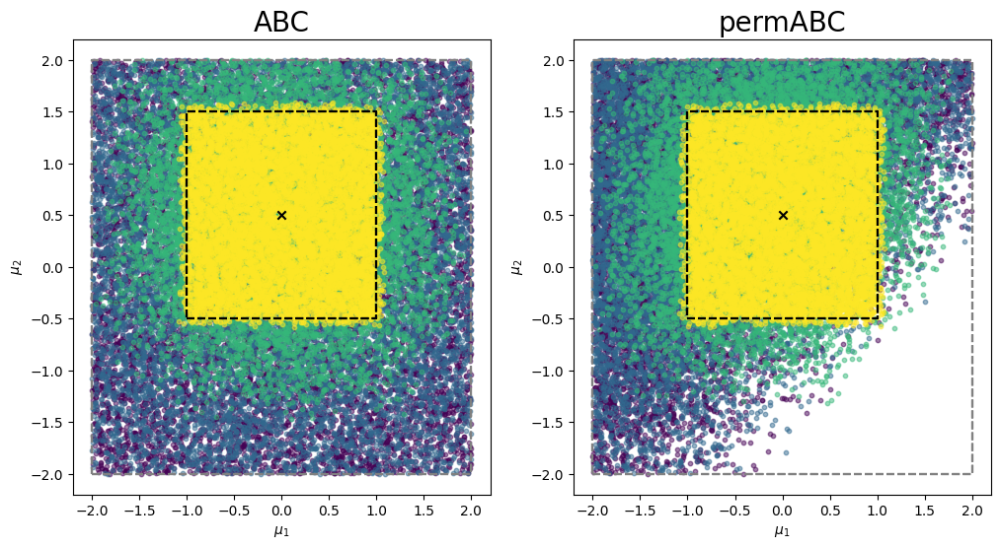

In [ ]:
epsilons = [np.inf, 1.5, .5, .05]
colors =["tab:blue", "tab:red", "tab:orange", "gold"]
colors = plt.cm.viridis(np.linspace(0,1,len(epsilons)))
N = 10000


s = 1
x = np.linspace(-2,2,100)


f, ax = plt.subplots(1,2, figsize = (12,6))
for i, epsilon in enumerate(epsilons): 
    index = np.random.choice(np.where(dists<=epsilon)[0], N, replace = False)
    index_perm = np.random.choice(np.where(dists_perm<=epsilon)[0], N, replace = False)

    mus = thetas.loc[index].squeeze()
    
    mus_perm = thetas_perm.loc[index_perm].squeeze()
    
  
    ax[0].scatter(x=mus[:,0], y=mus[:,1], color = colors[i], alpha = .5,  s = 10)
    
    prior = np.array([[-2,-2],[2,-2],[2,2],[-2,2],[-2,-2]])
    posterior = np.array([[y[0]-s, y[1]-s], [y[0]+s, y[1]-s], [y[0]+s, y[1]+s], [y[0]-s, y[1]+s], [y[0]-s, y[1]-s]])

    ax[0].scatter(y_obs[0,0,0], y_obs[0,1,0], c='black', label='y',marker='x')
    # ax[0].plot(x,x, '--', color='black')
    ax[0].plot(posterior[:, 0], posterior[:, 1], color='black',linestyle='--')
    ax[0].plot(prior[:, 0], prior[:, 1], color='grey',linestyle='--')
    ax[0].set_title('ABC', fontsize = 20)
    ax[0].set_xlabel('$\\mu_1$')
    ax[0].set_ylabel('$\\mu_2$')
    ax[0].set_xlim(-2.2,2.2)
    ax[0].set_ylim(-2.2,2.2)
    ax[1].scatter(x=mus_perm[:, 0], y=mus_perm[:, 1], color = colors[i], alpha = .5, s=10)
    ax[1].scatter(y_obs[0,0,0], y_obs[0,1,0], c='black', label='y',marker='x')
    # ax[1].plot(x,x, '--', color='black')
    ax[1].plot(posterior[:, 0], posterior[:, 1], color='black',linestyle='--')
    ax[1].plot(prior[:, 0], prior[:, 1], color='grey',linestyle='--')
    ax[1].set_title('permABC', fontsize = 20)
    ax[1].set_xlabel('$\\mu_1$')
    ax[1].set_ylabel('$\\mu_2$')
    ax[1].set_xlim(-2.2,2.2)
    ax[1].set_ylim(-2.2,2.2)
plt.show()
    
    

In [ ]:
from distances import optimal_index_distance

In [19]:
key, subkey = random.split(key)
thetas = model_known.prior_generator(subkey, 1000)
key, subkey = random.split(key)
zs = model_known.data_generator(subkey, thetas)

dists_perm, ys_index, zs_index, _ = optimal_index_distance(model, zs, y_obs)

NameError: name 'optimal_index_distance' is not defined

In [ ]:
np.unique(ys_index, return_counts=True, axis = 0), np.unique(zs_index, return_counts=True, axis = 0)

((array([[0, 1]]), array([1000])),
 (array([[0, 1],
         [1, 0]]), array([504, 496])))

In [ ]:
index = dists_perm <= epsilon_star
index2 = dists_perm <= epsilon_star2

np.unique(zs_index[index], return_counts=True, axis = 0), np.unique(zs_index[index2], return_counts=True, axis = 0)

((array([[0, 1],
         [1, 0]]),
  array([338, 334])),
 (array([[0, 1],
         [1, 0]]),
  array([196, 198])))

In [ ]:
zs_perm = zs[np.arange(zs.shape[0])[:, None],zs_index]
print(np.all(np.abs(zs_perm[:,0])<= np.abs(zs_perm[:,1])))

True


/Users/antoineluciano/.pyenv/versions/3.10.13/envs/jax_env/lib/python3.10/site-packages/matplotlib/transforms.py:2058: RuntimeWarning: invalid value encountered in scalar multiply
  self._mtx[0, 1] *= sx
/Users/antoineluciano/.pyenv/versions/3.10.13/envs/jax_env/lib/python3.10/site-packages/matplotlib/transforms.py:2059: RuntimeWarning: invalid value encountered in scalar multiply
  self._mtx[0, 2] *= sx
/Users/antoineluciano/.pyenv/versions/3.10.13/envs/jax_env/lib/python3.10/site-packages/matplotlib/transforms.py:2060: RuntimeWarning: invalid value encountered in scalar multiply
  self._mtx[1, 0] *= sy
/Users/antoineluciano/.pyenv/versions/3.10.13/envs/jax_env/lib/python3.10/site-packages/matplotlib/transforms.py:2062: RuntimeWarning: invalid value encountered in scalar multiply
  self._mtx[1, 2] *= sy


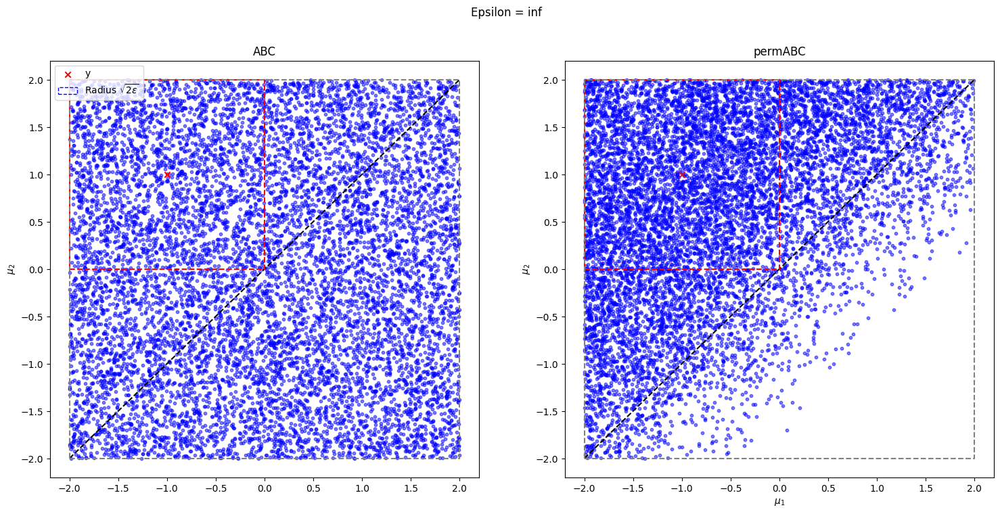

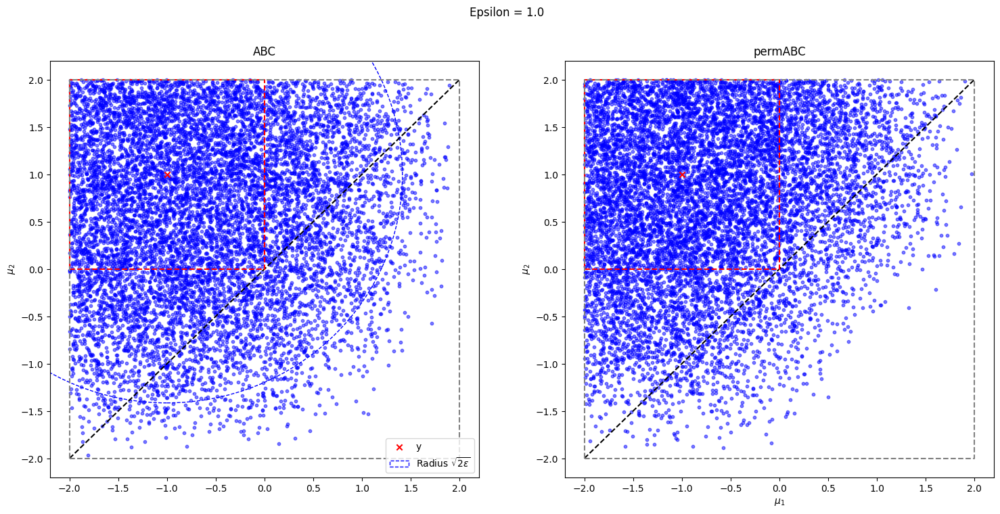

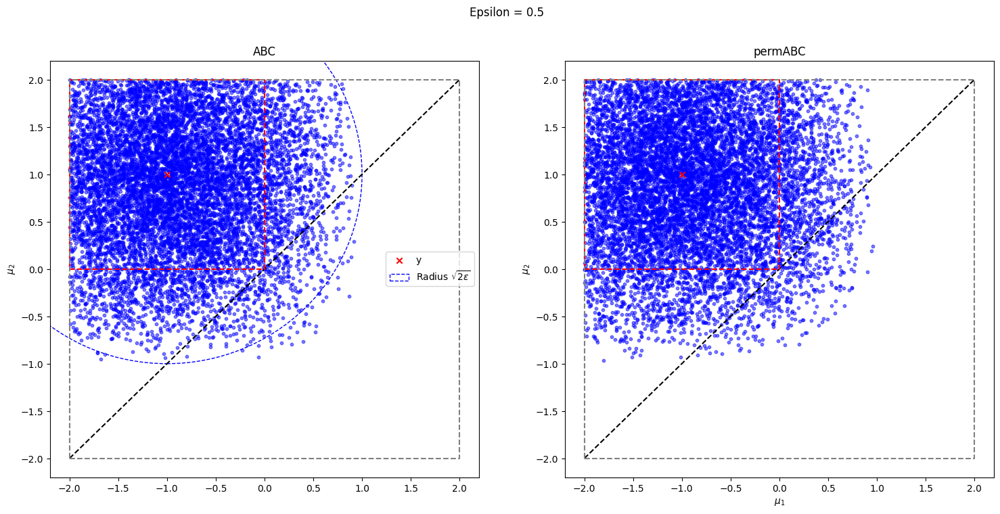

ValueError: Cannot take a larger sample than population when 'replace=False'

In [ ]:
epsilons = [np.inf, 1., .5, .0625, .05]
N = 10000
s = 1
x = np.linspace(-2,2,100)
for epsilon in epsilons: 
    index = np.random.choice(np.where(dists<=epsilon)[0], N, replace = False)
    index_perm = np.random.choice(np.where(dists_perm<=epsilon)[0], N, replace = False)

    mus = thetas.loc[index].squeeze()
    
    mus_perm = thetas_perm.loc[index_perm].squeeze()
    
    f, ax = plt.subplots(1,2, figsize = (18,8))
    # sns.kdeplot(x=mus[:,0], y=mus[:,1],ax = ax[0], cmap='viridis', thresh = .1, cbar=True,fill=True, levels = 4)
    ax[0].scatter(x=mus[:,0], y=mus[:,1], color = 'blue', alpha = .5,  s = 10)
    prior = np.array([[-2,-2],[2,-2],[2,2],[-2,2],[-2,-2]])
    posterior = np.array([[y[0]-s, y[1]-s], [y[0]+s, y[1]-s], [y[0]+s, y[1]+s], [y[0]-s, y[1]+s], [y[0]-s, y[1]-s]])

    ax[0].scatter(y_obs[0,0,0], y_obs[0,1,0], c='red', label='y',marker='x')
    ax[0].plot(x,x, '--', color='black')
    ax[0].plot(posterior[:, 0], posterior[:, 1], color='red',linestyle='--')
    ax[0].plot(prior[:, 0], prior[:, 1], color='grey',linestyle='--')
    ax[0].set_title('ABC')
    circle = plt.Circle((y_obs[0, 0, 0], y_obs[0, 1, 0]), radius=(2*epsilon)+1, color='blue', fill=False, linestyle='--', label='Radius $\sqrt{2\\epsilon}$')
    ax[0].add_artist(circle)
    ax[0].legend()
    ax[0].set_ylabel('$\\mu_2$')
    ax[0].set_xlim(-2.2,2.2)
    ax[0].set_ylim(-2.2,2.2)
    # sns.kdeplot(x=mus_perm[:, 0], y=mus_perm[:, 1],ax = ax[1], cmap='viridis', thresh = .1, cbar=True,fill=True, levels = 4)
    ax[1].scatter(x=mus_perm[:, 0], y=mus_perm[:, 1], color = 'blue', alpha = .5, s=10)
    ax[1].scatter(y_obs[0,0,0], y_obs[0,1,0], c='red', label='y',marker='x')
    ax[1].plot(x,x, '--', color='black')
    ax[1].plot(posterior[:, 0], posterior[:, 1], color='red',linestyle='--')
    ax[1].plot(prior[:, 0], prior[:, 1], color='grey',linestyle='--')
    ax[1].set_title('permABC')
    ax[1].set_xlabel('$\\mu_1$')
    ax[1].set_ylabel('$\\mu_2$')
    ax[1].set_xlim(-2.2,2.2)
    ax[1].set_ylim(-2.2,2.2)
    
    plt.suptitle("Epsilon = {}".format(epsilon))
    plt.show()
    
    

In [ ]:
model_known.weights_distance

array([0.5, 0.5])

In [ ]:
np.min(np.max(d, axis = 1))

0.06378503

# CALCUL EPSILON* Montrer comment ca se contracte pour le meme epsilon > et < epsilon star

In [88]:
thetas.loc.shape

(40000, 2, 1)

Performing full optimal assignment (no prior indices).
DISTANCE VANILLA: min = 0.0042509716004133224, max = 2.1880617141723633, mean = 0.8666173815727234 <= espilon_star = 993
DISTANCE PERM: min = 0.0024838398676365614, max = 2.1684389114379883, mean = 0.7599242925643921 <= espilon_star = 1848


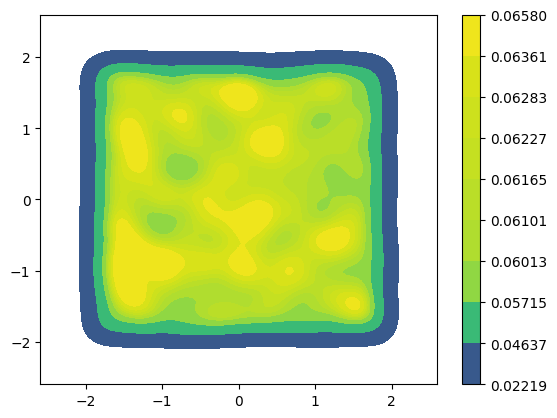

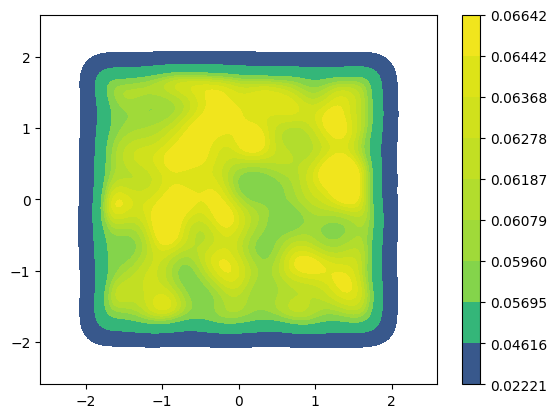

Performing full optimal assignment (no prior indices).
(40000, 2)
(array([[0, 1]]), array([0]))
DISTANCE VANILLA: min = 0.0042509716004133224, max = 2.1880617141723633, mean = 0.8666173815727234 <= espilon_star = 993
DISTANCE PERM: min = 0.0024838398676365614, max = 2.1684389114379883, mean = 0.7599242925643921 <= espilon_star = 1848


In [89]:
Nsim = 40000
zs, thetas, dists,_ = abc_vanilla(subkey, model_known, Nsim, np.inf, y_obs)
## permABC
key, subkey = random.split(key)
zs_perm, thetas_perm, dists_perm, _ = perm_abc_vanilla(subkey, model_known, Nsim, np.inf, y_obs)

print("DISTANCE VANILLA: min = {}, max = {}, mean = {} <= espilon_star = {}".format(np.min(dists), np.max(dists), np.mean(dists), np.sum(dists<=epsilon_star)))
print("DISTANCE PERM: min = {}, max = {}, mean = {} <= espilon_star = {}".format(np.min(dists_perm), np.max(dists_perm), np.mean(dists_perm), np.sum(dists_perm<=epsilon_star)))
thetas.loc.shape
sns.kdeplot(x=thetas.loc[:,0,0], y=thetas.loc[:,1,0], cmap='viridis', thresh = .05, cbar=True,fill=True)
plt.show()
key, subkey = random.split(key)
thetas = model.prior_generator(subkey, Nsim)
sns.kdeplot(x=thetas.loc[:,0,0], y=thetas.loc[:,1,0], cmap='viridis', thresh = .05, cbar=True,fill=True)
plt.show()
# key, subkey = random.split(key)
# zs = model.data_generator(subkey, thetas)
dists = model.distance(zs, y_obs)
from distances import optimal_index_distance
dists_perm, _, zs_index, _ = optimal_index_distance(model, zs = zs_perm, y_obs = y_obs, epsilon = 0, verbose= 2)
print(zs_index.shape)
print(np.unique(zs_index, axis = 0, return_index=True))
zs_perm = zs[np.arange(Nsim)[:,None], zs_index]
thetas_perm = thetas.apply_permutation(zs_index)



print("DISTANCE VANILLA: min = {}, max = {}, mean = {} <= espilon_star = {}".format(np.min(dists), np.max(dists), np.mean(dists), np.sum(dists<=epsilon_star)))
print("DISTANCE PERM: min = {}, max = {}, mean = {} <= espilon_star = {}".format(np.min(dists_perm), np.max(dists_perm), np.mean(dists_perm), np.sum(dists_perm<=epsilon_star)))

In [6]:
key, subkey = random.split(key)
Nsim = 1000000
zs, thetas, dists,_ = abc_vanilla(subkey, model_known, Nsim, np.inf, y_obs)
## permABC
key, subkey = random.split(key)
zs_perm, thetas_perm, dists_perm, _ = perm_abc_vanilla(subkey, model_known, Nsim, np.inf, y_obs)
print("DISTANCE VANILLA: min = {}, max = {}, mean = {} <= espilon_star = {}".format(np.min(dists), np.max(dists), np.mean(dists), np.sum(dists<=epsilon_star)))
print("DISTANCE PERM: min = {}, max = {}, mean = {} <= espilon_star = {}".format(np.min(dists_perm), np.max(dists_perm), np.mean(dists_perm), np.sum(dists_perm<=epsilon_star)))

Performing full optimal assignment (no prior indices).
DISTANCE VANILLA: min = 0.00023923406843096018, max = 2.2733070850372314, mean = 0.8642826676368713 <= espilon_star = 24628
DISTANCE PERM: min = 0.00021618169557768852, max = 2.2068610191345215, mean = 0.7561365962028503 <= espilon_star = 48810


In [20]:
from distances import optimal_index_distance
Nsim = 1000000
key, subkey = random.split(key)
thetas = model_known.prior_generator(subkey, Nsim)
key, subkey = random.split(key)
zs = model_known.data_generator(subkey, thetas)
dists = model_known.distance(zs, y_obs)
dists_perm, _, zs_index, _ = optimal_index_distance(model_known, zs = zs, y_obs = y_obs, epsilon = 0, verbose= 2)
thetas_perm = thetas.apply_permutation(zs_index)
zs_perm = zs[np.arange(Nsim)[:,None], zs_index]
print("DISTANCE VANILLA: min = {}, max = {}, mean = {} <= espilon_star = {}".format(np.min(dists), np.max(dists), np.mean(dists), np.sum(dists<=epsilon_star)))
print("DISTANCE PERM: min = {}, max = {}, mean = {} <= espilon_star = {}".format(np.min(dists_perm), np.max(dists_perm), np.mean(dists_perm), np.sum(dists_perm<=epsilon_star)))

Performing full optimal assignment (no prior indices).
DISTANCE VANILLA: min = 0.000547942123375833, max = 2.2560806274414062, mean = 0.8650849461555481 <= espilon_star = 24429
DISTANCE PERM: min = 0.000547942123375833, max = 2.2560806274414062, mean = 0.7573262453079224 <= espilon_star = 48937


In [104]:
thetas.loc.shape, zs.shape

((10000000, 2, 1), (10000000, 2, 1))

In [14]:
np.unique(zs, axis = 0, return_index=True)[0].shape

(1000000, 2, 1)

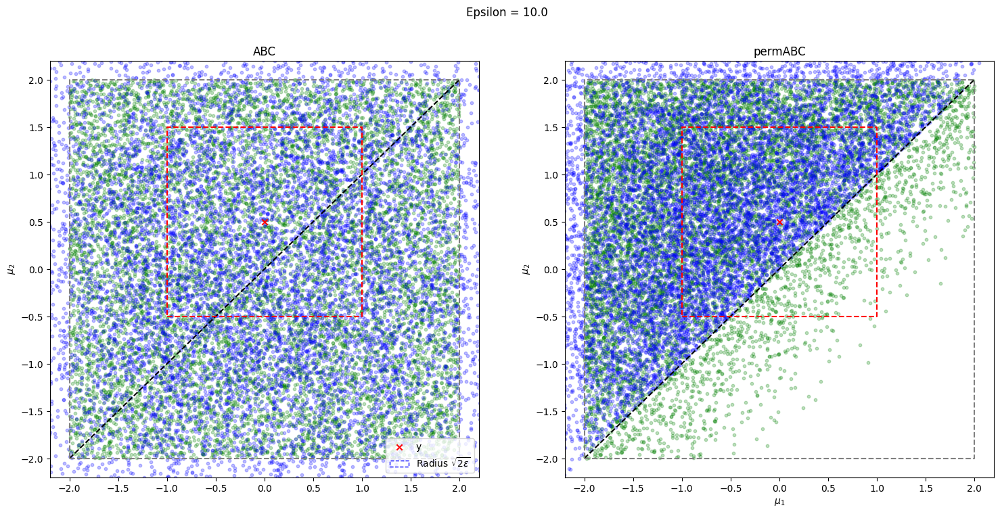

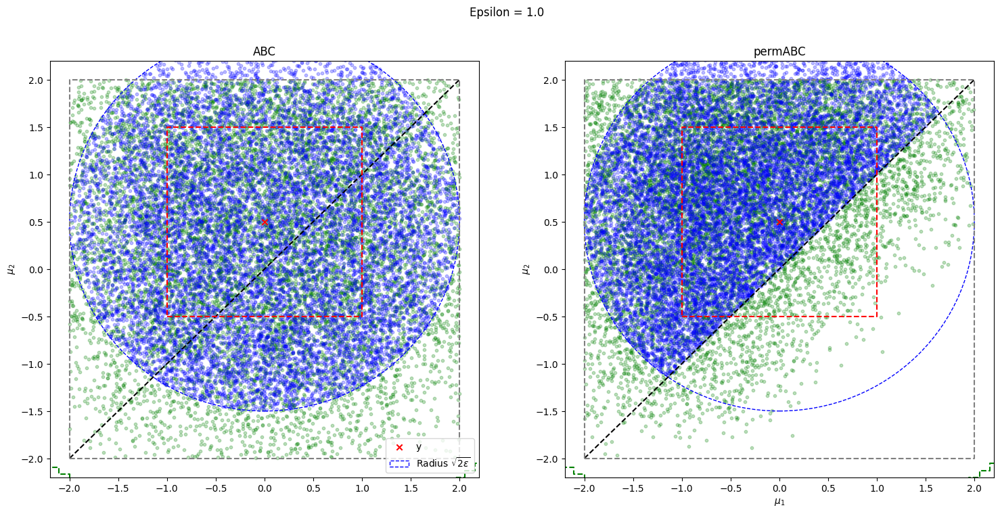

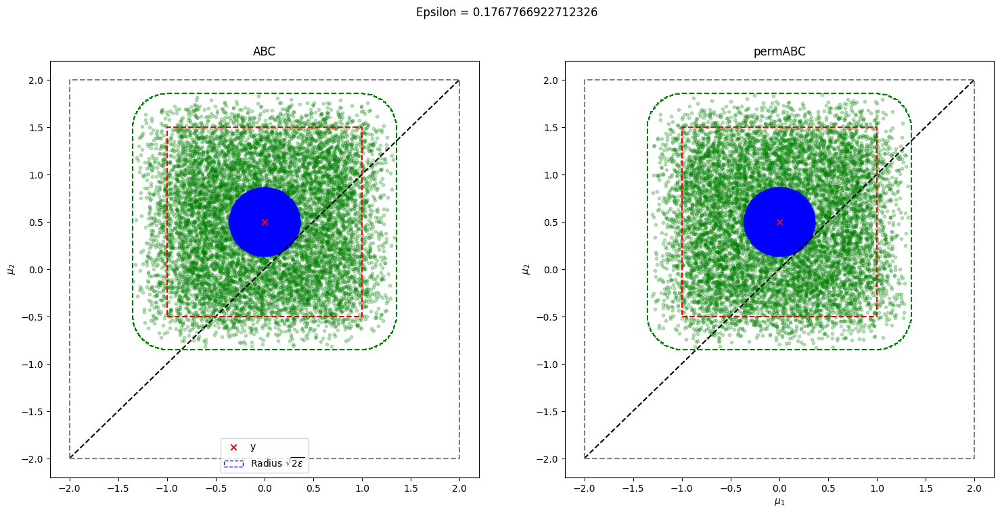

In [ ]:
epsilons = [10., 1., epsilon_star]
N = 10000
s = 1
alpha_fig = .25
x = np.linspace(-2,2,100)
y = y_obs[0, :, 0]
from shapely.geometry import Point, box
from shapely.ops import unary_union
for epsilon in epsilons: 
    index = np.random.choice(np.where(dists<=epsilon)[0], N, replace = False)
    index_perm = np.random.choice(np.where(dists_perm<=epsilon)[0], N, replace = False)

    zss = zs[index].squeeze()
    zss_perm = zs_perm[index_perm].squeeze()
    
    mus = thetas.loc[index].squeeze()
    mus_perm = thetas_perm.loc[index_perm].squeeze()
    
    
    
    
    f, ax = plt.subplots(1,2, figsize = (18,8))
    # sns.kdeplot(x=mus[:,0], y=mus[:,1],ax = ax[0], cmap='viridis', thresh = .1, cbar=True,fill=True, levels = 4)
    ax[0].scatter(x=mus[:,0], y=mus[:,1], color = 'green', alpha = alpha_fig,  s = 10)
    ax[0].scatter(x=zss[:,0], y=zss[:,1], color = 'blue', alpha = alpha_fig,  s = 10)
    prior = np.array([[-2,-2],[2,-2],[2,2],[-2,2],[-2,-2]])
    posterior = np.array([[y[0]-s, y[1]-s], [y[0]+s, y[1]-s], [y[0]+s, y[1]+s], [y[0]-s, y[1]+s], [y[0]-s, y[1]-s]])
    n = 100
    angles = np.linspace(0, 2*np.pi, n)
    xs = y_obs[0,0,0] + 2*epsilon * np.cos(angles)
    ys = y_obs[0,1,0] + 2*epsilon * np.sin(angles)

    # Créer un carré centré en chaque point du disque
    carres = [box(x0 - 1, y0 - 1, x0 + 1, y0 + 1) for x0, y0 in zip(xs, ys)]

    # Union de tous les carrés
    forme = unary_union(carres)

    xs, ys = forme.exterior.xy
    ax[0].plot(xs, ys, linestyle='--', color = "green")
    ax[0].scatter(y_obs[0,0,0], y_obs[0,1,0], c='red', label='y',marker='x')
    ax[0].plot(x,x, '--', color='black')
    ax[0].plot(posterior[:, 0], posterior[:, 1], color='red',linestyle='--')
    ax[0].plot(prior[:, 0], prior[:, 1], color='grey',linestyle='--')
    ax[0].set_title('ABC')
    circle = plt.Circle((y_obs[0, 0, 0], y_obs[0, 1, 0]), radius=(2*epsilon), color='blue', fill=False, linestyle='--', label='Radius ${2\\epsilon}$')
    ax[0].add_artist(circle)
    ax[0].legend()
    ax[0].set_ylabel('$\\mu_2$')
    ax[0].set_xlim(-2.2,2.2)
    ax[0].set_ylim(-2.2,2.2)
    # sns.kdeplot(x=mus_perm[:, 0], y=mus_perm[:, 1],ax = ax[1], cmap='viridis', thresh = .1, cbar=True,fill=True, levels = 4)
    ax[1].scatter(x=mus_perm[:, 0], y=mus_perm[:, 1], color = 'green', alpha = alpha_fig, s=10)
    ax[1].scatter(x=zss_perm[:, 0], y=zss_perm[:, 1], color = 'blue', alpha = alpha_fig, s=10)
    ax[1].scatter(y_obs[0,0,0], y_obs[0,1,0], c='red', label='y',marker='x')
    ax[1].plot(xs, ys, linestyle='--', color = "green")
    ax[1].plot(x,x, '--', color='black')
    ax[1].plot(posterior[:, 0], posterior[:, 1], color='red',linestyle='--')
    ax[1].plot(prior[:, 0], prior[:, 1], color='grey',linestyle='--')
    circle = plt.Circle((y_obs[0, 0, 0], y_obs[0, 1, 0]), radius=(2*epsilon), color='blue', fill=False, linestyle='--', label='Radius ${2\\epsilon}$')
    ax[1].add_artist(circle)
    ax[1].set_title('permABC')
    ax[1].set_xlabel('$\\mu_1$')
    ax[1].set_ylabel('$\\mu_2$')
    ax[1].set_xlim(-2.2,2.2)
    ax[1].set_ylim(-2.2,2.2)
    
    plt.suptitle("Epsilon = {}".format(epsilon))
    plt.show()
    
    

In [87]:
# Initialization
import os 

os.chdir("/Users/antoineluciano/Documents/Recherche/permABC_new/permABC")
import sys
sys.path.append(os.getcwd())

from vanilla import abc_vanilla, perm_abc_vanilla
from smc import abc_smc, perm_abc_smc
from over_sampling import perm_abc_smc_os
from kernels import KernelTruncatedRW
from models.uniform import Uniform
from models.uniform_known import Uniform_known
from jax import random
import numpy as np
import jax.numpy as jnp
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# With unknown Beta

model = Uniform(K = 2)
# y_obs = np.array([-1,1])[None, :, None]
y_obs = np.array([0., 1])[None, :, None]
key = random.PRNGKey(0)
y = y_obs[0,:,0]
epsilon_star = model.distance(y_obs, y_obs[:,::-1])[0]/2
print("Epsilon star", epsilon_star)

model_known = Uniform_known(K = 2)
## ABC
key, subkey = random.split(key)
Nsim = 10000000
zs, thetas, dists,_ = abc_vanilla(subkey, model_known, Nsim, np.inf, y_obs)
dists = dists[:,0]

dist_verif = model_known.distance(zs, y_obs)
print("VERIFICATION:", np.all(dists == dist_verif))
## permABC
key, subkey = random.split(key)
zs_perm, thetas_perm, dists_perm, _ = perm_abc_vanilla(subkey, model_known, Nsim, np.inf, y_obs)

print("VERIFICATION_perm :", np.all(dists_perm == model_known.distance(zs_perm, y_obs)))

print("DISTANCE VANILLA: min = {}, max = {}, mean = {} <= espilon_star = {}".format(np.min(dists), np.max(dists), np.mean(dists), np.sum(dists<=epsilon_star)))
print("DISTANCE PERM: min = {}, max = {}, mean = {} <= espilon_star = {}".format(np.min(dists_perm), np.max(dists_perm), np.mean(dists_perm), np.sum(dists_perm<=epsilon_star)))
model_known.reset_weights_distance()
key, subkey = random.split(key)
thetas2 = model.prior_generator(subkey, Nsim)
key, subkey = random.split(key)
zs2 = model.data_generator(subkey, thetas2)
dists2 = model.distance(zs2, y_obs)
from distances import optimal_index_distance
dists_perm2, _, zs_index, _ = optimal_index_distance(model, zs = zs2, y_obs = y_obs, epsilon = 0, verbose= 0)
print(np.unique(zs_index, return_counts=True, axis = 0))
zs_perm2 = zs2[np.arange(Nsim)[:,None], zs_index]

thetas_perm2 = thetas2.copy().apply_permutation(zs_index)

print("VERIFICATION2_perm :", np.all(dists_perm2 == model_known.distance(zs_perm2, y_obs)))


print("DISTANCE VANILLA: min = {}, max = {}, mean = {} <= espilon_star = {}".format(np.min(dists2), np.max(dists2), np.mean(dists2), np.sum(dists2<=epsilon_star)))
print("DISTANCE PERM: min = {}, max = {}, mean = {} <= espilon_star = {}".format(np.min(dists_perm2), np.max(dists_perm2), np.mean(dists_perm2), np.sum(dists_perm2<=epsilon_star)))


Epsilon star 0.35355338
VERIFICATION: True
Performing full optimal assignment (no prior indices).
VERIFICATION_perm : True
DISTANCE VANILLA: min = 0.0006533745909109712, max = 2.4546444416046143, mean = 0.9426959156990051 <= espilon_star = 906526
DISTANCE PERM: min = 0.00013035893789492548, max = 2.4805262088775635, mean = 0.7441763281822205 <= espilon_star = 1816532
(array([[0, 1],
       [1, 0]]), array([5001059, 4998941]))
VERIFICATION2_perm : True
DISTANCE VANILLA: min = 0.00012712666648440063, max = 2.443521499633789, mean = 0.8970994353294373 <= espilon_star = 964461
DISTANCE PERM: min = 0.00012712666648440063, max = 2.409755229949951, mean = 0.7005047798156738 <= espilon_star = 1927475


In [99]:
# model_known.reset_weights_distance()
model_known = Uniform_known(K = 2)
Nsim = 100000
key, subkey = random.split(key)
thetas2 = model_known.prior_generator(subkey, Nsim)
key, subkey = random.split(key)
zs2 = model_known.data_generator(subkey, thetas2).squeeze()

mus2 = thetas2.loc.squeeze()
np.mean(np.sqrt(np.sum((zs2-mus2)**2, axis = 1)))

(100000, 2, 1)


0.7646233

In [95]:
zs = zs.squeeze()
zs2 = zs2.squeeze()
mus = thetas.loc.squeeze()
mus2 = thetas2.loc.squeeze()    
np.mean(np.sqrt(np.sum((zs-mus)**2, axis = 1))), np.mean(np.sqrt(np.sum((zs2-mus2)**2, axis = 1)))

(0.76532114, 0.38310733)

Epsilon star 0.35355338
VERIFICATION: True
Performing full optimal assignment (no prior indices).
VERIFICATION_perm : True
DISTANCE VANILLA: min = 0.0006533745909109712, max = 2.4546444416046143, mean = 0.9426959156990051 <= espilon_star = 906526
DISTANCE PERM: min = 0.00013035893789492548, max = 2.4805262088775635, mean = 0.7441763281822205 <= espilon_star = 1816532
(array([[0, 1],
       [1, 0]]), array([5001059, 4998941]))
VERIFICATION2_perm : True
DISTANCE VANILLA: min = 0.00012712666648440063, max = 2.443521499633789, mean = 0.8970994353294373 <= espilon_star = 964461
DISTANCE PERM: min = 0.00012712666648440063, max = 2.409755229949951, mean = 0.7005047798156738 <= espilon_star = 1927475
For epsilon = inf index < epsilon = 10000000 index_perm < epsilon = 10000000
Perm: mean = -0.006141968537122011, std = 1.1532963514328003 min = -1.9998736381530762, max = 1.999910831451416
Vanilla: mean = -0.017751052975654602, std = 1.1553937196731567 min = -1.9995298385620117, max = 1.9999852180

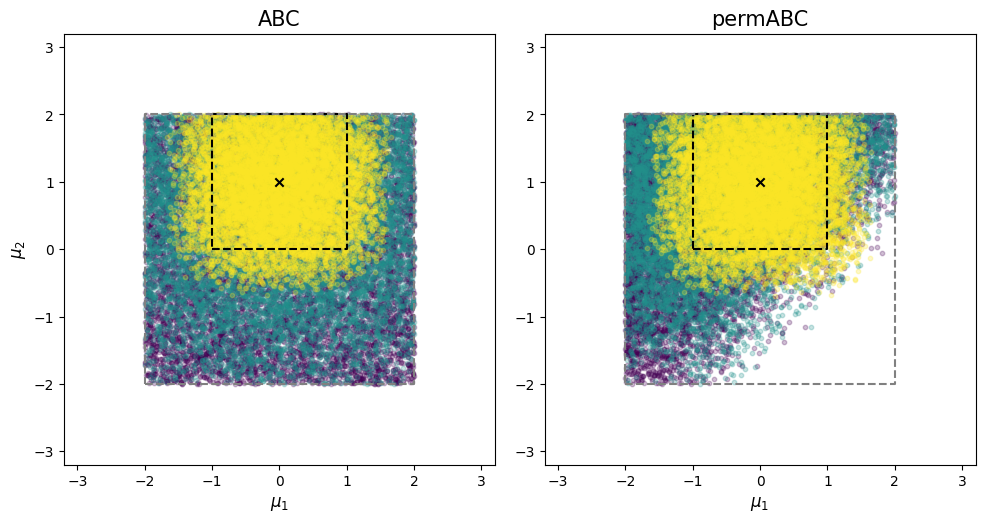

For epsilon = inf index < epsilon = 10000000 index_perm < epsilon = 10000000
Perm: mean = 0.0008990932255983353, std = 1.1537317037582397 min = -1.9997940063476562, max = 1.999765396118164
Vanilla: mean = 0.008920514956116676, std = 1.1518610715866089 min = -1.9999136924743652, max = 1.9996633529663086
For epsilon = 1.3535534143447876 index < epsilon = 8104775 index_perm < epsilon = 9196672
Perm: mean = 0.09393975883722305, std = 1.1221556663513184 min = -1.9999394416809082, max = 1.9999208450317383
Vanilla: mean = 0.1486499309539795, std = 1.0847833156585693 min = -1.9984068870544434, max = 1.9999632835388184
For epsilon = 0.3535533845424652 index < epsilon = 906526 index_perm < epsilon = 1816532
Perm: mean = 0.4913806617259979, std = 0.6864669919013977 min = -1.542201042175293, max = 1.998459815979004
Vanilla: mean = 0.48924970626831055, std = 0.6786298751831055 min = -1.4399819374084473, max = 1.9988651275634766


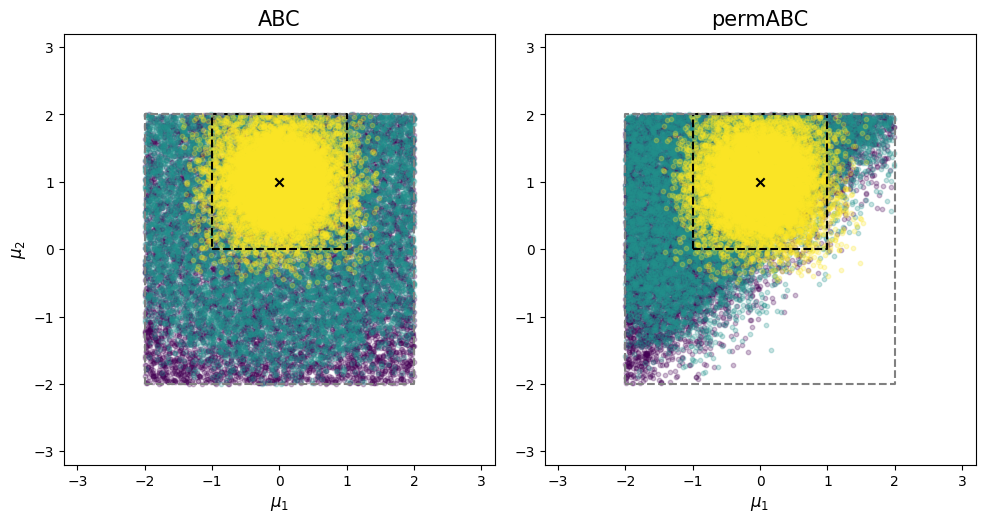

For epsilon = inf index < epsilon = 10000000 index_perm < epsilon = 10000000
Perm: mean = 0.004288460593670607, std = 1.2925738096237183 min = -2.978332281112671, max = 2.9720795154571533
Vanilla: mean = 0.012400565668940544, std = 1.2887957096099854 min = -2.975536346435547, max = 2.967583417892456
For epsilon = 1.3535534143447876 index < epsilon = 8104775 index_perm < epsilon = 9196672
Perm: mean = 0.1296287178993225, std = 1.2140358686447144 min = -2.6883485317230225, max = 2.9869203567504883
Vanilla: mean = 0.17776158452033997, std = 1.1332824230194092 min = -2.681183099746704, max = 2.951002359390259
For epsilon = 0.3535533845424652 index < epsilon = 906526 index_perm < epsilon = 1816532
Perm: mean = 0.4824940860271454, std = 0.5917941331863403 min = -0.705845832824707, max = 1.7045392990112305
Vanilla: mean = 0.4812591075897217, std = 0.5945988893508911 min = -0.7062721252441406, max = 1.7048285007476807


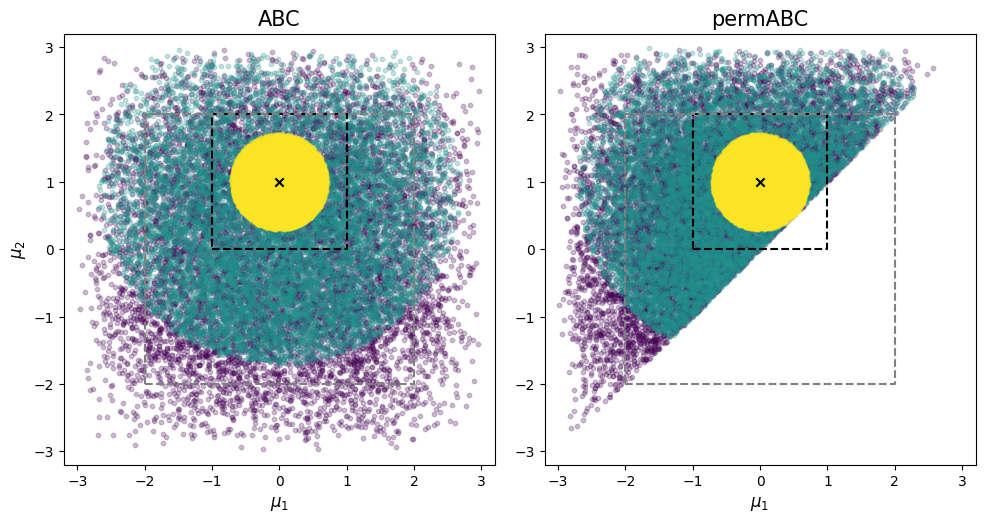

For epsilon = inf index < epsilon = 10000000 index_perm < epsilon = 10000000
Perm: mean = 0.005950519815087318, std = 1.2040331363677979 min = -2.855238914489746, max = 2.906712293624878
Vanilla: mean = 0.008296217769384384, std = 1.2012019157409668 min = -2.869962692260742, max = 2.8972115516662598
For epsilon = 1.3535534143447876 index < epsilon = 8104775 index_perm < epsilon = 9196672
Perm: mean = 0.0958545133471489, std = 1.160446286201477 min = -2.6725122928619385, max = 2.870163917541504
Vanilla: mean = 0.15837642550468445, std = 1.0932193994522095 min = -2.6965346336364746, max = 2.851043939590454
For epsilon = 0.3535533845424652 index < epsilon = 906526 index_perm < epsilon = 1816532
Perm: mean = 0.4929434061050415, std = 0.6081551313400269 min = -0.7047622203826904, max = 1.7015182971954346
Vanilla: mean = 0.4985830783843994, std = 0.6052466034889221 min = -0.706409215927124, max = 1.7033475637435913


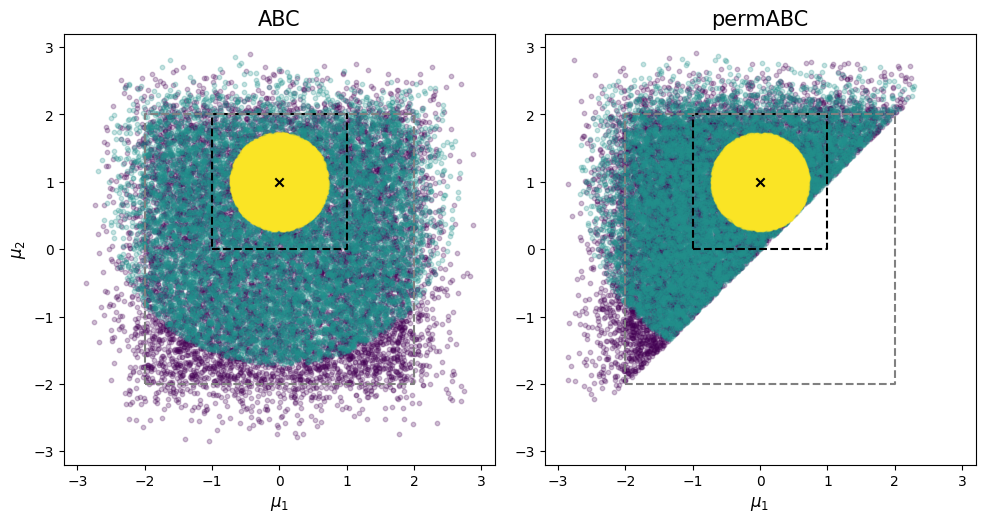

In [67]:
# Initialization
import os 

os.chdir("/Users/antoineluciano/Documents/Recherche/permABC_new/permABC")
import sys
sys.path.append(os.getcwd())

from vanilla import abc_vanilla, perm_abc_vanilla
from smc import abc_smc, perm_abc_smc
from over_sampling import perm_abc_smc_os
from kernels import KernelTruncatedRW
from models.uniform import Uniform
from models.uniform_known import Uniform_known
from jax import random
import numpy as np
import jax.numpy as jnp
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# With unknown Beta

model = Uniform(K = 2)
# y_obs = np.array([-1,1])[None, :, None]
y_obs = np.array([0., 1])[None, :, None]
key = random.PRNGKey(0)
y = y_obs[0,:,0]
epsilon_star = model.distance(y_obs, y_obs[:,::-1])[0]/2
print("Epsilon star", epsilon_star)

model_known = Uniform_known(K = 2)
## ABC
key, subkey = random.split(key)
Nsim = 10000000
zs, thetas, dists,_ = abc_vanilla(subkey, model_known, Nsim, np.inf, y_obs)
dists = dists[:,0]

dist_verif = model_known.distance(zs, y_obs)
print("VERIFICATION:", np.all(dists == dist_verif))
## permABC
key, subkey = random.split(key)
zs_perm, thetas_perm, dists_perm, _ = perm_abc_vanilla(subkey, model_known, Nsim, np.inf, y_obs)

print("VERIFICATION_perm :", np.all(dists_perm == model_known.distance(zs_perm, y_obs)))

print("DISTANCE VANILLA: min = {}, max = {}, mean = {} <= espilon_star = {}".format(np.min(dists), np.max(dists), np.mean(dists), np.sum(dists<=epsilon_star)))
print("DISTANCE PERM: min = {}, max = {}, mean = {} <= espilon_star = {}".format(np.min(dists_perm), np.max(dists_perm), np.mean(dists_perm), np.sum(dists_perm<=epsilon_star)))
model_known.reset_weights_distance()
key, subkey = random.split(key)
thetas2 = model.prior_generator(subkey, Nsim)
key, subkey = random.split(key)
zs2 = model.data_generator(subkey, thetas2)
dists2 = model.distance(zs2, y_obs)
from distances import optimal_index_distance
dists_perm2, _, zs_index, _ = optimal_index_distance(model, zs = zs2, y_obs = y_obs, epsilon = 0, verbose= 0)
print(np.unique(zs_index, return_counts=True, axis = 0))
zs_perm2 = zs2[np.arange(Nsim)[:,None], zs_index]

thetas_perm2 = thetas2.copy().apply_permutation(zs_index)

print("VERIFICATION2_perm :", np.all(dists_perm2 == model_known.distance(zs_perm2, y_obs)))


print("DISTANCE VANILLA: min = {}, max = {}, mean = {} <= espilon_star = {}".format(np.min(dists2), np.max(dists2), np.mean(dists2), np.sum(dists2<=epsilon_star)))
print("DISTANCE PERM: min = {}, max = {}, mean = {} <= espilon_star = {}".format(np.min(dists_perm2), np.max(dists_perm2), np.mean(dists_perm2), np.sum(dists_perm2<=epsilon_star)))

epsilons = [np.inf, epsilon_star+1, epsilon_star]
colors =["tab:blue", "tab:red", "tab:orange", "gold"]
colors = plt.cm.viridis(np.linspace(0,1,len(epsilons)))
N = 10000
s = 1
x = np.linspace(-2,2,100)
alpha_fig = 0.25
fontsize = 12
title_size = 15


f, ax = plt.subplots(1,2, figsize = (10,5), tight_layout=True)

for i, epsilon in enumerate(epsilons): 
    print("For epsilon = {} index < epsilon = {} index_perm < epsilon = {}".format(epsilon, np.sum(dists<=epsilon), np.sum(dists_perm<=epsilon)))
    index = np.random.choice(np.where(dists<=epsilon)[0], N, replace = False)
    index_perm = np.random.choice(np.where(dists_perm<=epsilon)[0], N, replace = False)

    mus = thetas.loc[index].squeeze()
    
    mus_perm = thetas_perm.loc[index_perm].squeeze()
    print("Perm: mean = {}, std = {} min = {}, max = {}".format(np.mean(mus_perm), np.std(mus_perm), np.min(mus_perm), np.max(mus_perm)))
    print("Vanilla: mean = {}, std = {} min = {}, max = {}".format(np.mean(mus), np.std(mus), np.min(mus), np.max(mus)))
    ax[0].scatter(x=mus[:,0], y=mus[:,1], color = colors[i], alpha = alpha_fig,  s = 10)
    ax[1].scatter(x=mus_perm[:, 0], y=mus_perm[:, 1], color = colors[i], alpha = alpha_fig, s=10)
prior = np.array([[-2,-2],[2,-2],[2,2],[-2,2],[-2,-2]])
posterior = np.array([[y[0]-s, y[1]-s], [y[0]+s, y[1]-s], [y[0]+s, y[1]+s], [y[0]-s, y[1]+s], [y[0]-s, y[1]-s]])
ax[0].scatter(y_obs[0,0,0], y_obs[0,1,0], c='black', label='y',marker='x')
# ax[0].plot(x,x, '--', color='black')
ax[0].plot(posterior[:, 0], posterior[:, 1], color='black',linestyle='--')
ax[0].plot(prior[:, 0], prior[:, 1], color='grey',linestyle='--')
ax[0].set_title("ABC", fontsize = title_size)
ax[0].set_xlabel('$\\mu_1$', fontsize = fontsize)
ax[0].set_ylabel('$\\mu_2$', fontsize = fontsize)
ax[0].set_xlim(-3.2,3.2)
ax[0].set_ylim(-3.2,3.2)
ax[0].set_aspect('equal')
ax[1].set_aspect('equal')
ax[1].scatter(y_obs[0,0,0], y_obs[0,1,0], c='black', label='y',marker='x')
# ax[1].plot(x,x, '--', color='black')
ax[1].plot(posterior[:, 0], posterior[:, 1], color='black',linestyle='--')
ax[1].plot(prior[:, 0], prior[:, 1], color='grey',linestyle='--')
ax[1].set_title('permABC', fontsize = title_size)
ax[1].set_xlabel('$\\mu_1$', fontsize = fontsize)
# ax[1].set_ylabel('$\\mu_2$', fontsize = fontsize)
ax[1].set_xlim(-3.2,3.2)
ax[1].set_ylim(-3.2,3.2)
plt.show()
# plt.savefig("figures/perm_vs_vanilla.svg", dpi=300)
# plt.savefig("figures/perm_vs_vanilla.png", dpi=300)
# plt.savefig("figures/perm_vs_vanilla.pdf", dpi=300)

f, ax = plt.subplots(1,2, figsize = (10,5), tight_layout=True)

for i, epsilon in enumerate(epsilons): 
    print("For epsilon = {} index < epsilon = {} index_perm < epsilon = {}".format(epsilon, np.sum(dists<=epsilon), np.sum(dists_perm<=epsilon)))
    index = np.random.choice(np.where(dists2<=epsilon)[0], N, replace = False)
    index_perm = np.random.choice(np.where(dists_perm2<=epsilon)[0], N, replace = False)

    
    mus = thetas2.loc[index].squeeze()
    mus_perm = thetas_perm2.loc[index_perm].squeeze()
    
    
    print("Perm: mean = {}, std = {} min = {}, max = {}".format(np.mean(mus_perm), np.std(mus_perm), np.min(mus_perm), np.max(mus_perm)))
    print("Vanilla: mean = {}, std = {} min = {}, max = {}".format(np.mean(mus), np.std(mus), np.min(mus), np.max(mus)))
    ax[0].scatter(x=mus[:,0], y=mus[:,1], color = colors[i], alpha = alpha_fig,  s = 10)
    ax[1].scatter(x=mus_perm[:, 0], y=mus_perm[:, 1], color = colors[i], alpha = alpha_fig, s=10)
prior = np.array([[-2,-2],[2,-2],[2,2],[-2,2],[-2,-2]])
posterior = np.array([[y[0]-s, y[1]-s], [y[0]+s, y[1]-s], [y[0]+s, y[1]+s], [y[0]-s, y[1]+s], [y[0]-s, y[1]-s]])
ax[0].scatter(y_obs[0,0,0], y_obs[0,1,0], c='black', label='y',marker='x')
# ax[0].plot(x,x, '--', color='black')
ax[0].plot(posterior[:, 0], posterior[:, 1], color='black',linestyle='--')
ax[0].plot(prior[:, 0], prior[:, 1], color='grey',linestyle='--')
ax[0].set_title("ABC", fontsize = title_size)
ax[0].set_xlabel('$\\mu_1$', fontsize = fontsize)
ax[0].set_ylabel('$\\mu_2$', fontsize = fontsize)
ax[0].set_xlim(-3.2,3.2)
ax[0].set_ylim(-3.2,3.2)
ax[0].set_aspect('equal')
ax[1].set_aspect('equal')
ax[1].scatter(y_obs[0,0,0], y_obs[0,1,0], c='black', label='y',marker='x')
# ax[1].plot(x,x, '--', color='black')
ax[1].plot(posterior[:, 0], posterior[:, 1], color='black',linestyle='--')
ax[1].plot(prior[:, 0], prior[:, 1], color='grey',linestyle='--')
ax[1].set_title('permABC', fontsize = title_size)
ax[1].set_xlabel('$\\mu_1$', fontsize = fontsize)
# ax[1].set_ylabel('$\\mu_2$', fontsize = fontsize)
ax[1].set_xlim(-3.2,3.2)
ax[1].set_ylim(-3.2,3.2)
plt.show()

f, ax = plt.subplots(1,2, figsize = (10,5), tight_layout=True)

for i, epsilon in enumerate(epsilons): 
    print("For epsilon = {} index < epsilon = {} index_perm < epsilon = {}".format(epsilon, np.sum(dists<=epsilon), np.sum(dists_perm<=epsilon)))
    index = np.random.choice(np.where(dists<=epsilon)[0], N, replace = False)
    index_perm = np.random.choice(np.where(dists_perm<=epsilon)[0], N, replace = False)

    mus = zs[index].squeeze()
    
    mus_perm = zs_perm[index_perm].squeeze()
    print("Perm: mean = {}, std = {} min = {}, max = {}".format(np.mean(mus_perm), np.std(mus_perm), np.min(mus_perm), np.max(mus_perm)))
    print("Vanilla: mean = {}, std = {} min = {}, max = {}".format(np.mean(mus), np.std(mus), np.min(mus), np.max(mus)))
    ax[0].scatter(x=mus[:,0], y=mus[:,1], color = colors[i], alpha = alpha_fig,  s = 10)
    ax[1].scatter(x=mus_perm[:, 0], y=mus_perm[:, 1], color = colors[i], alpha = alpha_fig, s=10)
prior = np.array([[-2,-2],[2,-2],[2,2],[-2,2],[-2,-2]])
posterior = np.array([[y[0]-s, y[1]-s], [y[0]+s, y[1]-s], [y[0]+s, y[1]+s], [y[0]-s, y[1]+s], [y[0]-s, y[1]-s]])
ax[0].scatter(y_obs[0,0,0], y_obs[0,1,0], c='black', label='y',marker='x')
# ax[0].plot(x,x, '--', color='black')
ax[0].plot(posterior[:, 0], posterior[:, 1], color='black',linestyle='--')
ax[0].plot(prior[:, 0], prior[:, 1], color='grey',linestyle='--')
ax[0].set_title("ABC", fontsize = title_size)
ax[0].set_xlabel('$\\mu_1$', fontsize = fontsize)
ax[0].set_ylabel('$\\mu_2$', fontsize = fontsize)
ax[0].set_xlim(-3.2,3.2)
ax[0].set_ylim(-3.2,3.2)
ax[0].set_aspect('equal')
ax[1].set_aspect('equal')
ax[1].scatter(y_obs[0,0,0], y_obs[0,1,0], c='black', label='y',marker='x')
# ax[1].plot(x,x, '--', color='black')
ax[1].plot(posterior[:, 0], posterior[:, 1], color='black',linestyle='--')
ax[1].plot(prior[:, 0], prior[:, 1], color='grey',linestyle='--')
ax[1].set_title('permABC', fontsize = title_size)
ax[1].set_xlabel('$\\mu_1$', fontsize = fontsize)
# ax[1].set_ylabel('$\\mu_2$', fontsize = fontsize)
ax[1].set_xlim(-3.2,3.2)
ax[1].set_ylim(-3.2,3.2)
plt.show()
# plt.savefig("figures/perm_vs_vanilla.svg", dpi=300)
# plt.savefig("figures/perm_vs_vanilla.png", dpi=300)
# plt.savefig("figures/perm_vs_vanilla.pdf", dpi=300)

f, ax = plt.subplots(1,2, figsize = (10,5), tight_layout=True)

for i, epsilon in enumerate(epsilons): 
    print("For epsilon = {} index < epsilon = {} index_perm < epsilon = {}".format(epsilon, np.sum(dists<=epsilon), np.sum(dists_perm<=epsilon)))

    index = np.random.choice(np.where(dists2<=epsilon)[0], N, replace = False)
    index_perm = np.random.choice(np.where(dists_perm2<=epsilon)[0], N, replace = False)

    mus = zs2[index].squeeze()
    mus_perm = zs_perm2[index_perm].squeeze()
    
    print("Perm: mean = {}, std = {} min = {}, max = {}".format(np.mean(mus_perm), np.std(mus_perm), np.min(mus_perm), np.max(mus_perm)))
    print("Vanilla: mean = {}, std = {} min = {}, max = {}".format(np.mean(mus), np.std(mus), np.min(mus), np.max(mus)))
    
    ax[0].scatter(x=mus[:,0], y=mus[:,1], color = colors[i], alpha = alpha_fig,  s = 10)
    ax[1].scatter(x=mus_perm[:, 0], y=mus_perm[:, 1], color = colors[i], alpha = alpha_fig, s=10)
prior = np.array([[-2,-2],[2,-2],[2,2],[-2,2],[-2,-2]])
posterior = np.array([[y[0]-s, y[1]-s], [y[0]+s, y[1]-s], [y[0]+s, y[1]+s], [y[0]-s, y[1]+s], [y[0]-s, y[1]-s]])
ax[0].scatter(y_obs[0,0,0], y_obs[0,1,0], c='black', label='y',marker='x')
# ax[0].plot(x,x, '--', color='black')
ax[0].plot(posterior[:, 0], posterior[:, 1], color='black',linestyle='--')
ax[0].plot(prior[:, 0], prior[:, 1], color='grey',linestyle='--')
ax[0].set_title("ABC", fontsize = title_size)
ax[0].set_xlabel('$\\mu_1$', fontsize = fontsize)
ax[0].set_ylabel('$\\mu_2$', fontsize = fontsize)
ax[0].set_xlim(-3.2,3.2)
ax[0].set_ylim(-3.2,3.2)
ax[0].set_aspect('equal')
ax[1].set_aspect('equal')
ax[1].scatter(y_obs[0,0,0], y_obs[0,1,0], c='black', label='y',marker='x')
# ax[1].plot(x,x, '--', color='black')
ax[1].plot(posterior[:, 0], posterior[:, 1], color='black',linestyle='--')
ax[1].plot(prior[:, 0], prior[:, 1], color='grey',linestyle='--')
ax[1].set_title('permABC', fontsize = title_size)
ax[1].set_xlabel('$\\mu_1$', fontsize = fontsize)
# ax[1].set_ylabel('$\\mu_2$', fontsize = fontsize)
ax[1].set_xlim(-3.2,3.2)
ax[1].set_ylim(-3.2,3.2)
plt.show()

In [86]:
Nsim = 5000000
key, subkey = random.split(key)
thetas = model_known.prior_generator(subkey, Nsim)
key, subkey = random.split(key)
zs = model_known.data_generator(subkey, thetas)

mus = thetas.loc.squeeze()
zs = zs.squeeze()

print(np.mean(np.sqrt(np.sum((mus-zs)**2, axis = 1))))

(5000000, 2, 1)
0.765399


In [73]:
mus = thetas.loc.squeeze()
mus2 = thetas2.loc.squeeze()

In [79]:
mus = thetas.loc.squeeze()
mus2 = thetas2.loc.squeeze()
np.mean(np.sum(mus**2, axis = 1)), np.mean(np.sum(mus2**2, axis = 1))

(2.6674993, 2.666144)

In [ ]:
t

In [68]:
np.max(dists), np.max(dists2)

(Array(2.4546444, dtype=float32), Array(2.4435215, dtype=float32))

In [69]:
np.max(zs), np.max(zs2)

(Array(2.9981456, dtype=float32), Array(2.9871128, dtype=float32))

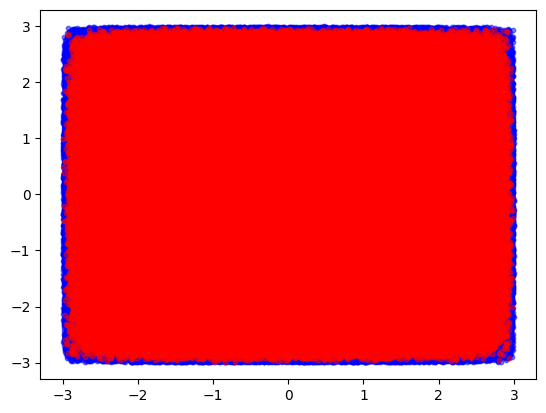

In [ ]:


plt.scatter(zs[:,0], zs[:,1], color = "blue", alpha = .5, s=10)
plt.scatter(zs2[:,0], zs2[:,1], color = "red", alpha = .5, s=10)

In [80]:
np.sum((zs.squeeze()-mus)**2, axis = 1).mean(), np.sum((zs2.squeeze()-mus2)**2, axis = 1).mean()

(Array(0.6668745, dtype=float32), Array(0.2221471, dtype=float32))

In [35]:
model.distance(np.array([[[3],[3]]]), np.array([[[0],[0]]]))

Array([2.1213202], dtype=float32)

In [50]:
np.mean(dists),  np.std(dists), np.mean(dists2), np.std(dists2)

(Array(0.8379204, dtype=float32),
 Array(0.36303425, dtype=float32),
 Array(0.8376652, dtype=float32),
 Array(0.36282846, dtype=float32))

In [12]:
Nsim = 10000
key, subkey = random.split(key)
zs, thetas, dists, _ = abc_vanilla(subkey, model_known, Nsim, np.inf, y_obs)
dists = dists[:,0]
dists2 = model_known.distance(zs, y_obs)
print("Shapes: dists = {}, dists2 = {}".format(dists.shape, dists2.shape))

Shapes: dists = (10000,), dists2 = (10000,)


In [13]:
np.allclose(dists, dists2)

True

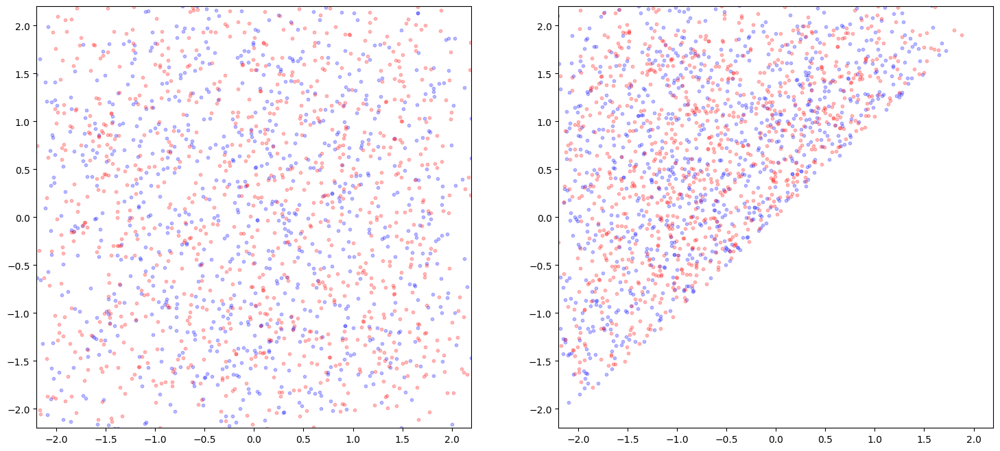

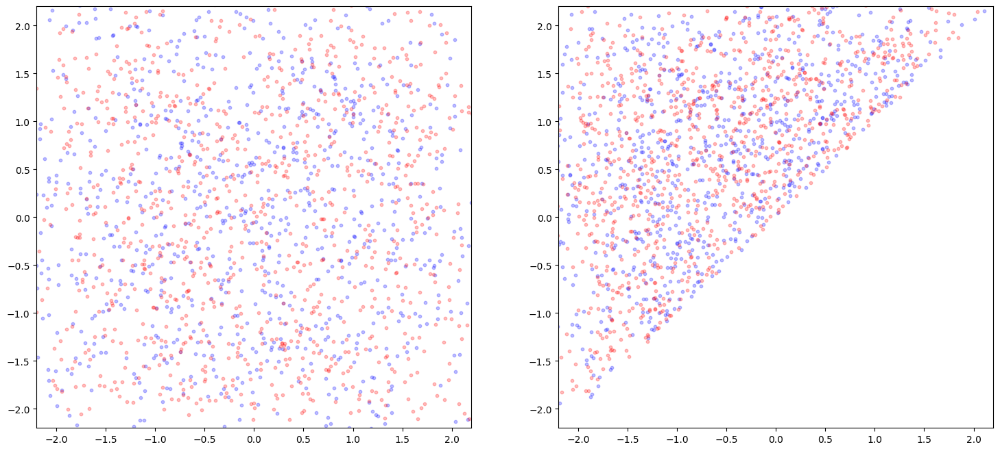

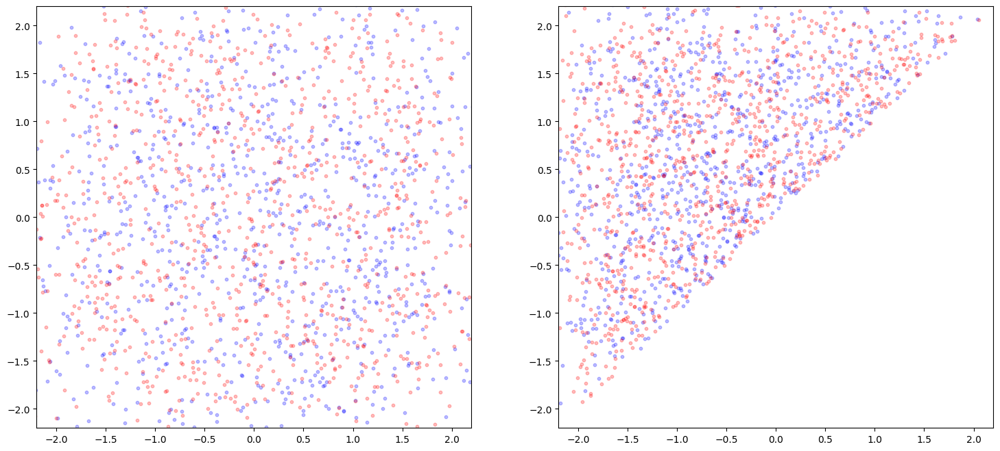

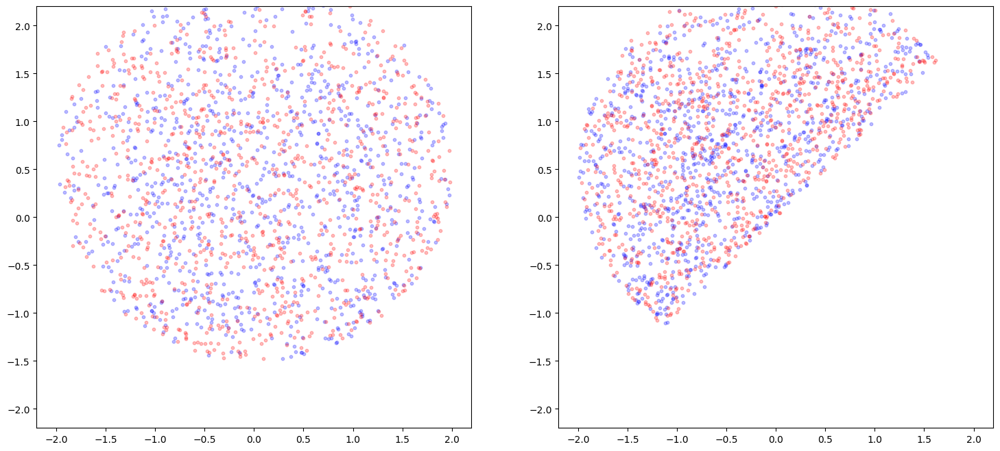

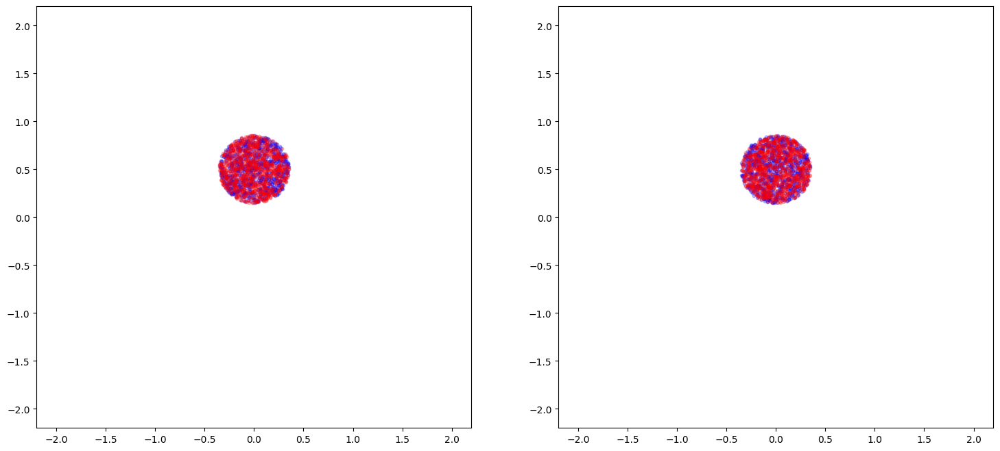

In [43]:
epsilons = [10., 5, 2., 1., epsilon_star]
for epsilon in epsilons: 
    index = np.random.choice(np.where(dists<=epsilon)[0], N, replace = False)
    index_perm = np.random.choice(np.where(dists_perm<=epsilon)[0], N, replace = False)

    mus = thetas.loc[index].squeeze()
    mus_perm = thetas_perm.loc[index_perm].squeeze()
    
    zss = zs[index].squeeze()
    zss_perm = zs_perm[index_perm].squeeze()    
    
    index2 = np.random.choice(np.where(dists2<=epsilon)[0], N, replace = False)
    index_perm2 = np.random.choice(np.where(dists_perm2<=epsilon)[0], N, replace = False)
    
    mus2 = thetas2.loc[index2].squeeze()
    mus_perm2 = thetas_perm2.loc[index_perm2].squeeze()
    zss2 = zs2[index2].squeeze()
    zss_perm2 = zs_perm2[index_perm2].squeeze()
    f, ax = plt.subplots(1,2, figsize = (18,8))
    ax[0].scatter(x = zss[:,0], y = zss[:,1], color = 'blue', alpha = alpha_fig,  s = 10)
    ax[0].scatter(x = zss2[:,0], y = zss2[:,1], color = 'red', alpha = alpha_fig,  s = 10)

    ax[1].scatter(x = zss_perm[:,0], y = zss_perm[:,1], color = 'blue', alpha = alpha_fig,  s = 10)
    ax[1].scatter(x = zss_perm2[:,0], y = zss_perm2[:,1], color = 'red', alpha = alpha_fig,  s = 10)
    ax[0].set_xlim(-2.2,2.2)
    ax[0].set_ylim(-2.2,2.2)
    ax[1].set_xlim(-2.2,2.2)
    ax[1].set_ylim(-2.2,2.2)
    
    plt.show()
    

DISTANCE1: with no perm: min = 25.635557174682617 max = 25.635557174682617, mean = 25.635557174682617
DISTANCE2: with no perm: min = 15.391298294067383 max = 15.391298294067383, mean = 15.391298294067383
DISTANCE1: with perm: min = 25.87679100036621 max = 25.87679100036621, mean = 25.87679100036621
DISTANCE2: with perm: min = 15.423837661743164 max = 15.423837661743164, mean = 15.423837661743164


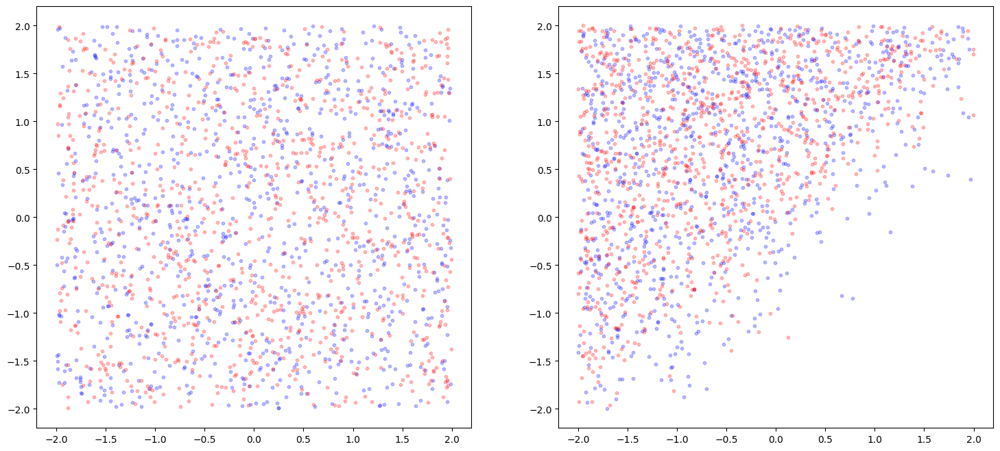

DISTANCE1: with no perm: min = 25.80108070373535 max = 25.80108070373535, mean = 25.80108070373535
DISTANCE2: with no perm: min = 15.231514930725098 max = 15.231514930725098, mean = 15.231514930725098
DISTANCE1: with perm: min = 25.812503814697266 max = 25.812503814697266, mean = 25.812503814697266
DISTANCE2: with perm: min = 14.547853469848633 max = 14.547853469848633, mean = 14.547853469848633


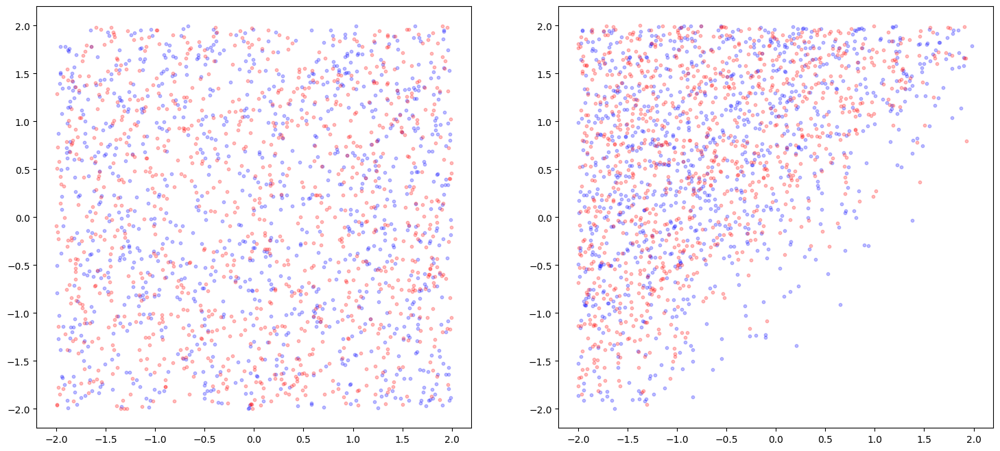

DISTANCE1: with no perm: min = 25.7607421875 max = 25.7607421875, mean = 25.7607421875
DISTANCE2: with no perm: min = 14.724675178527832 max = 14.724675178527832, mean = 14.724675178527832
DISTANCE1: with perm: min = 25.964107513427734 max = 25.964107513427734, mean = 25.964107513427734
DISTANCE2: with perm: min = 14.867605209350586 max = 14.867605209350586, mean = 14.867605209350586


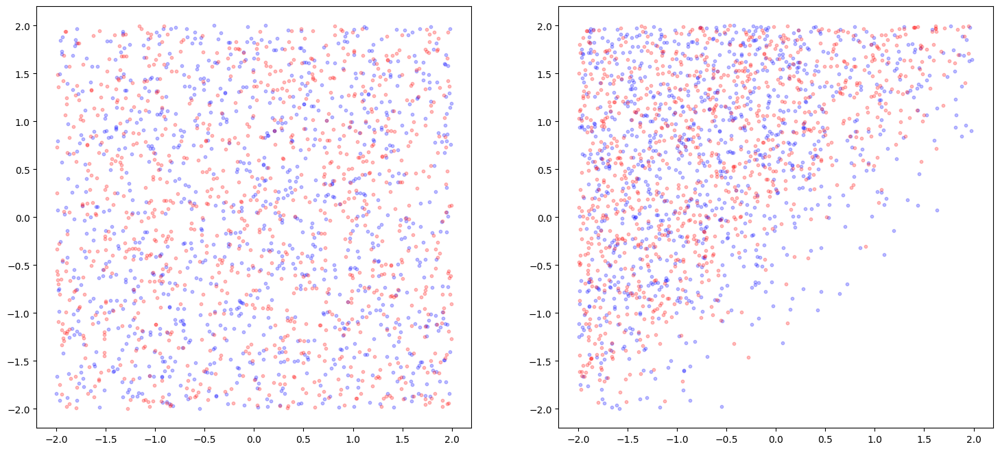

DISTANCE1: with no perm: min = 25.60454750061035 max = 25.60454750061035, mean = 25.60454750061035
DISTANCE2: with no perm: min = 14.699331283569336 max = 14.699331283569336, mean = 14.699331283569336
DISTANCE1: with perm: min = 25.249313354492188 max = 25.249313354492188, mean = 25.249313354492188
DISTANCE2: with perm: min = 14.290955543518066 max = 14.290955543518066, mean = 14.290955543518066


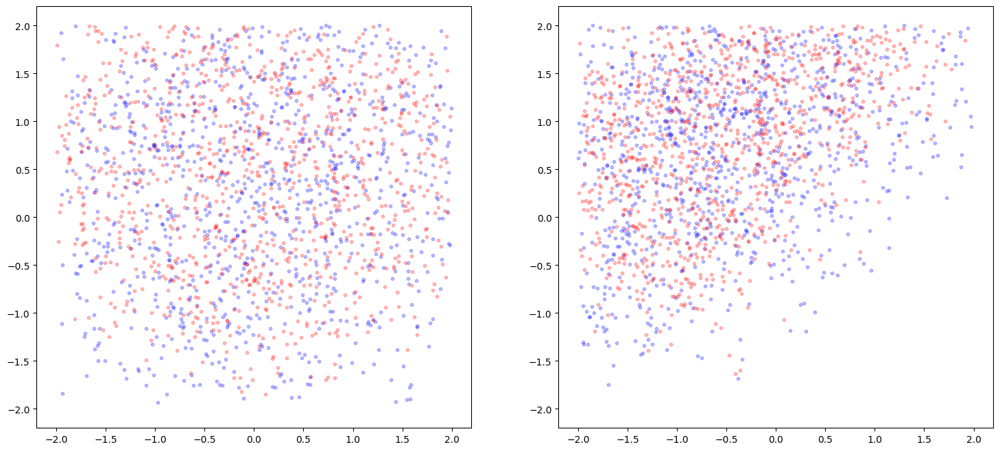

DISTANCE1: with no perm: min = 25.346643447875977 max = 25.346643447875977, mean = 25.346643447875977
DISTANCE2: with no perm: min = 14.463958740234375 max = 14.463958740234375, mean = 14.463958740234375
DISTANCE1: with perm: min = 25.442432403564453 max = 25.442432403564453, mean = 25.442432403564453
DISTANCE2: with perm: min = 15.370689392089844 max = 15.370689392089844, mean = 15.370689392089844


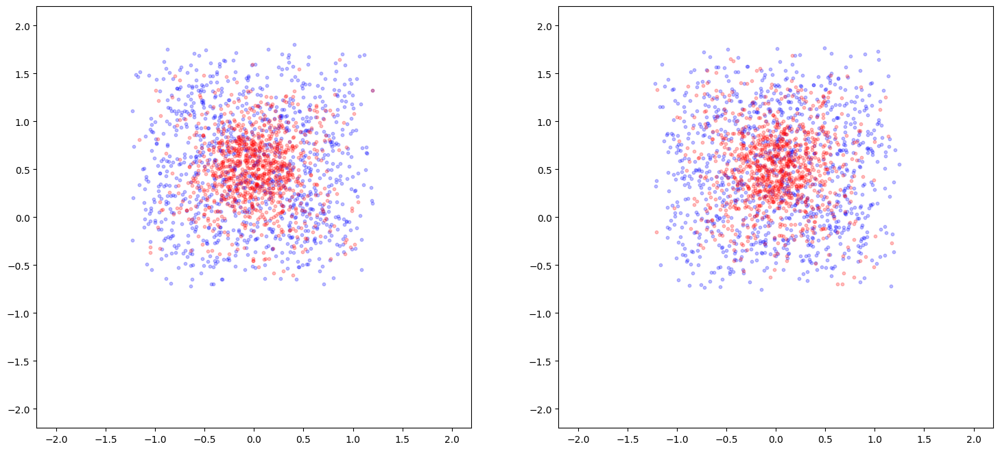

In [44]:
epsilons = [10., 5, 2., 1., epsilon_star]
for epsilon in epsilons: 
    index = np.random.choice(np.where(dists<=epsilon)[0], N, replace = False)
    index_perm = np.random.choice(np.where(dists_perm<=epsilon)[0], N, replace = False)

    mus = thetas.loc[index].squeeze()
    mus_perm = thetas_perm.loc[index_perm].squeeze()
    
    zss = zs[index].squeeze()
    zss_perm = zs_perm[index_perm].squeeze()    
    
    index2 = np.random.choice(np.where(dists2<=epsilon)[0], N, replace = False)
    index_perm2 = np.random.choice(np.where(dists_perm2<=epsilon)[0], N, replace = False)
    
    mus2 = thetas2.loc[index2].squeeze()
    mus_perm2 = thetas_perm2.loc[index_perm2].squeeze()
    
    zss2 = zs2[index2].squeeze()
    zss_perm2 = zs_perm2[index_perm2].squeeze()
    
    d = np.sqrt(np.sum((mus-zss)**2))
    d2 = np.sqrt(np.sum((mus2-zss2)**2))
    
    d_perm = np.sqrt(np.sum((mus_perm-zss_perm)**2))
    d_perm2 = np.sqrt(np.sum((mus_perm2-zss_perm2)**2))
    
    print("DISTANCE1: with no perm: min = {} max = {}, mean = {}".format(np.min(d), np.max(d), np.mean(d)))
    print("DISTANCE2: with no perm: min = {} max = {}, mean = {}".format(np.min(d2), np.max(d2), np.mean(d2)))
    
    print("DISTANCE1: with perm: min = {} max = {}, mean = {}".format(np.min(d_perm), np.max(d_perm), np.mean(d_perm)))
    print("DISTANCE2: with perm: min = {} max = {}, mean = {}".format(np.min(d_perm2), np.max(d_perm2), np.mean(d_perm2)))
    
    
    f, ax = plt.subplots(1,2, figsize = (18,8))
    ax[0].scatter(x = mus[:,0], y = mus[:,1], color = 'blue', alpha = alpha_fig,  s = 10)
    ax[0].scatter(x = mus2[:,0], y = mus2[:,1], color = 'red', alpha = alpha_fig,  s = 10)
    
    ax[1].scatter(x = mus_perm[:,0], y = mus_perm[:,1], color = 'blue', alpha = alpha_fig,  s = 10)
    ax[1].scatter(x = mus_perm2[:,0], y = mus_perm2[:,1], color = 'red', alpha = alpha_fig,  s = 10)
    
    ax[0].set_xlim(-2.2,2.2)
    ax[0].set_ylim(-2.2,2.2)
    ax[1].set_xlim(-2.2,2.2)
    ax[1].set_ylim(-2.2,2.2)
    
    plt.show()
    

(5000000, 2, 1)
0.76511323


DISTANCE JAX: min = 0.0015192354330793023, max = 2.2450177669525146, mean = 0.8647025227546692
DISTANCE: min = 0.00035722681786864996, max = 2.269498586654663, mean = 0.8638408184051514


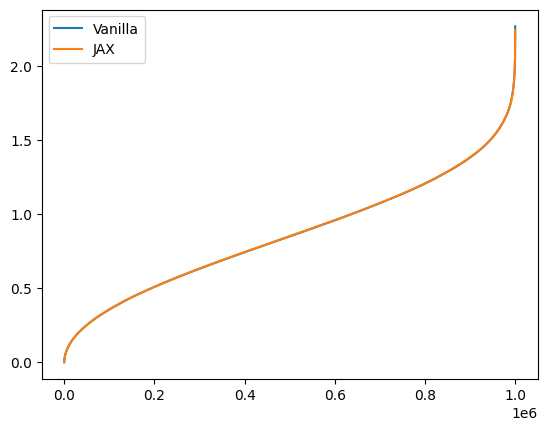

In [13]:
Nsim = 1000000
key, subkey = random.split(key)
thetas = model_known.prior_generator(subkey, Nsim)
key, subkey = random.split(key)
zs = model_known.data_generator(subkey, thetas)
dists = model_known.distance(zs, y_obs)

key, subkey = random.split(key)
thetas_jax, _ = model_known.prior_generator_jax(subkey, Nsim)
key, subkey = random.split(key)
zs_jax = model_known.data_generator_jax(subkey, thetas_jax, 0)
dists_jax = model_known.distance(zs_jax, y_obs)
print("DISTANCE JAX: min = {}, max = {}, mean = {}".format(np.min(dists_jax), np.max(dists_jax), np.mean(dists_jax)))
print("DISTANCE: min = {}, max = {}, mean = {}".format(np.min(dists), np.max(dists), np.mean(dists)))

plt.plot(np.sort(dists), label = "Vanilla")
plt.plot(np.sort(dists_jax), label = "JAX")
plt.legend()


In [21]:
from utils import Theta

In [35]:
Nsim = 10000
key, subkey = random.split(key)
true_theta = Theta(loc = np.repeat([[[0],[1/2]]], Nsim, axis =0))
print(true_theta.loc.shape)
key, subkey = random.split(key)
zs = model_known.data_generator(subkey, true_theta)
key, subkey = random.split(key)
zs_jax = model_known.data_generator_jax(subkey, true_theta.loc, 0)

(10000, 2, 1)


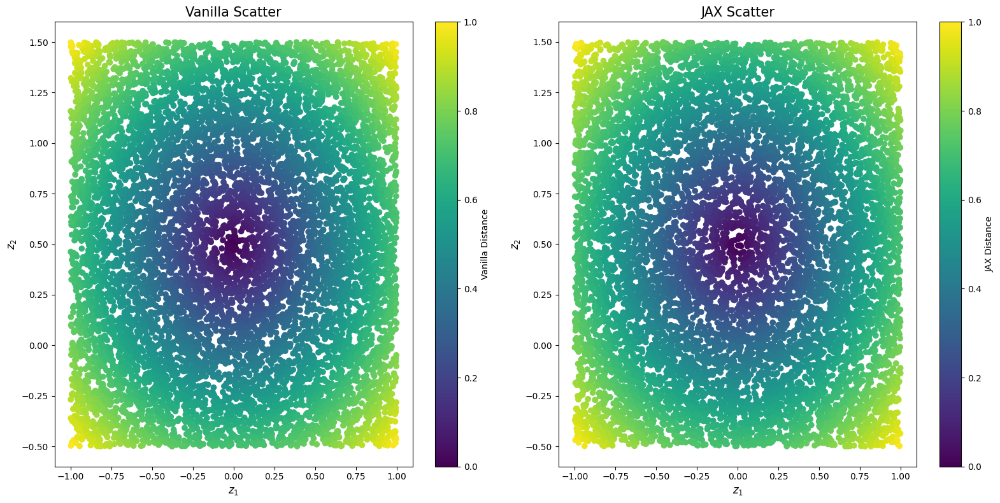

In [40]:
f, ax = plt.subplots(1, 2, figsize=(16, 8))

# Compute distances
dists = model_known.distance(zs, y_obs)
dists_jax = model_known.distance(zs_jax, y_obs)

# Normalize distances for color mapping
colors = (dists - np.min(dists)) / (np.max(dists) - np.min(dists))
colors_jax = (dists_jax - np.min(dists_jax)) / (np.max(dists_jax) - np.min(dists_jax))

# Scatter plot for Vanilla
scatter1 = ax[0].scatter(zs[:, 0], zs[:, 1], c=colors, cmap='viridis', label="Vanilla")
ax[0].set_title("Vanilla Scatter", fontsize=15)
ax[0].set_xlabel("$z_1$", fontsize=12)
ax[0].set_ylabel("$z_2$", fontsize=12)
plt.colorbar(scatter1, ax=ax[0], label="Vanilla Distance")

# Scatter plot for JAX
scatter2 = ax[1].scatter(zs_jax[:, 0], zs_jax[:, 1], c=colors_jax, cmap='viridis', label="JAX")
ax[1].set_title("JAX Scatter", fontsize=15)
ax[1].set_xlabel("$z_1$", fontsize=12)
ax[1].set_ylabel("$z_2$", fontsize=12)
plt.colorbar(scatter2, ax=ax[1], label="JAX Distance")

plt.tight_layout()
plt.show()